In [3]:
words = open('names.txt', 'r').read().splitlines()

In [4]:
words[:10]

['emma',
 'olivia',
 'ava',
 'isabella',
 'sophia',
 'charlotte',
 'mia',
 'amelia',
 'harper',
 'evelyn']

In [5]:
len(words)

32033

In [6]:
min(len(w) for w in words)

2

In [7]:
max(len(w) for w in words)

15

In [8]:
b = {}
for w in words:
    chs = ['<S>'] + list(w) + ['<E>']
    for ch1, ch2 in zip(chs, chs[1:]):
        bigram = (ch1, ch2)
        b[bigram] = b.get(bigram, 0) + 1 # incase the bigram isn't there in b, return 0 and add 1 to the value

In [9]:
sorted(b.items(), key = lambda kv: -kv[1]) # sort on the basis of the value in descending order, instead of the default firt argument (the key)

[(('n', '<E>'), 6763),
 (('a', '<E>'), 6640),
 (('a', 'n'), 5438),
 (('<S>', 'a'), 4410),
 (('e', '<E>'), 3983),
 (('a', 'r'), 3264),
 (('e', 'l'), 3248),
 (('r', 'i'), 3033),
 (('n', 'a'), 2977),
 (('<S>', 'k'), 2963),
 (('l', 'e'), 2921),
 (('e', 'n'), 2675),
 (('l', 'a'), 2623),
 (('m', 'a'), 2590),
 (('<S>', 'm'), 2538),
 (('a', 'l'), 2528),
 (('i', '<E>'), 2489),
 (('l', 'i'), 2480),
 (('i', 'a'), 2445),
 (('<S>', 'j'), 2422),
 (('o', 'n'), 2411),
 (('h', '<E>'), 2409),
 (('r', 'a'), 2356),
 (('a', 'h'), 2332),
 (('h', 'a'), 2244),
 (('y', 'a'), 2143),
 (('i', 'n'), 2126),
 (('<S>', 's'), 2055),
 (('a', 'y'), 2050),
 (('y', '<E>'), 2007),
 (('e', 'r'), 1958),
 (('n', 'n'), 1906),
 (('y', 'n'), 1826),
 (('k', 'a'), 1731),
 (('n', 'i'), 1725),
 (('r', 'e'), 1697),
 (('<S>', 'd'), 1690),
 (('i', 'e'), 1653),
 (('a', 'i'), 1650),
 (('<S>', 'r'), 1639),
 (('a', 'm'), 1634),
 (('l', 'y'), 1588),
 (('<S>', 'l'), 1572),
 (('<S>', 'c'), 1542),
 (('<S>', 'e'), 1531),
 (('j', 'a'), 1473),
 (

In [10]:
list(w)

['z', 'z', 'y', 'z', 'x']

In [11]:
import torch

In [12]:
N = torch.zeros((27,27), dtype = torch.int32)

In [13]:
chars = sorted(list(set(''.join(words))))
stoi = {s:i+1 for i,s in enumerate(chars)} # enumerating each of the letters and making a map out of it
stoi['.'] = 0 # make the special character '.' starting at 0, and all other characters following it
itos = {i:s for s,i in stoi.items()}
itos

{1: 'a',
 2: 'b',
 3: 'c',
 4: 'd',
 5: 'e',
 6: 'f',
 7: 'g',
 8: 'h',
 9: 'i',
 10: 'j',
 11: 'k',
 12: 'l',
 13: 'm',
 14: 'n',
 15: 'o',
 16: 'p',
 17: 'q',
 18: 'r',
 19: 's',
 20: 't',
 21: 'u',
 22: 'v',
 23: 'w',
 24: 'x',
 25: 'y',
 26: 'z',
 0: '.'}

In [14]:
for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]): # for each bigram in the word w
        ix1 = stoi[ch1] # index 1
        ix2 = stoi[ch2]
        N[ix1, ix2] += 1

In [15]:
import matplotlib.pyplot as plt
%matplotlib inline

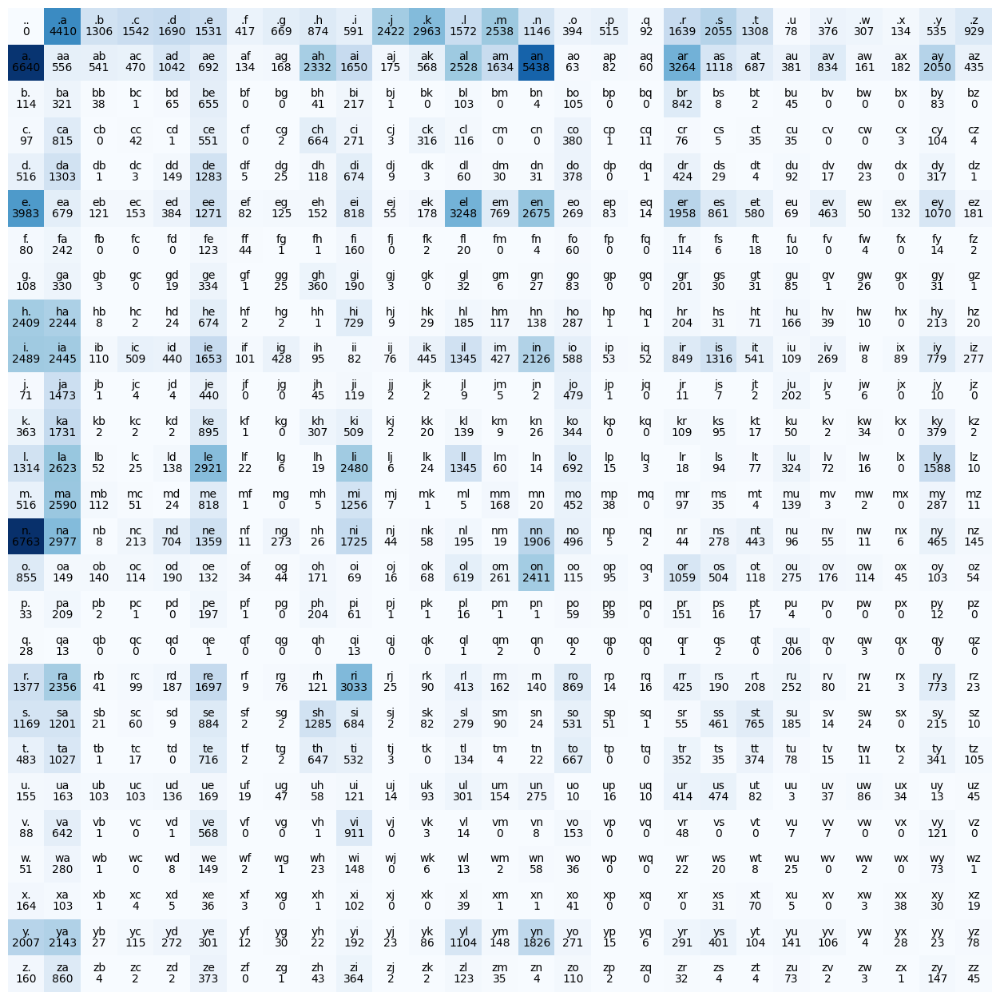

In [16]:
plt.figure(figsize=(16,16))
plt.imshow(N, cmap="Blues")

for i in range(27):
    for j in range(27):
        bigram_str = itos[i] + itos[j] # combine two characters to make a bigram
        plt.text(j, i, bigram_str, ha="center", va="bottom", color='black') # here, j and i represent the x and y coordinates respectively 
        plt.text(j, i, N[i,j].item(), ha="center", va="top", color='black')

plt.axis('off');

In [17]:
N[0].sum()

tensor(32033)

In [18]:
P = (N+1).float() # added one (a small smoothing number) to each number so that we don't end up with zero probabilities (infinte nll); called model smoothing
P.shape

torch.Size([27, 27])

In [19]:
P.sum(1, keepdim=True).shape # sum each of the rows (we're summing in the direction of dimension 1 (horizontally) to get the probabilities for each row)

torch.Size([27, 1])

In [20]:
# [27, 27] / [27, 1] broadcastable; the column vector is expanded horizontally 27 times so that it matches the shape [27,27]

In [21]:
P = P / P.sum(1, keepdim = True) # normalizing the rows; think what happens if keepdim=False; 

In [22]:
P[0].sum()

tensor(1.)

\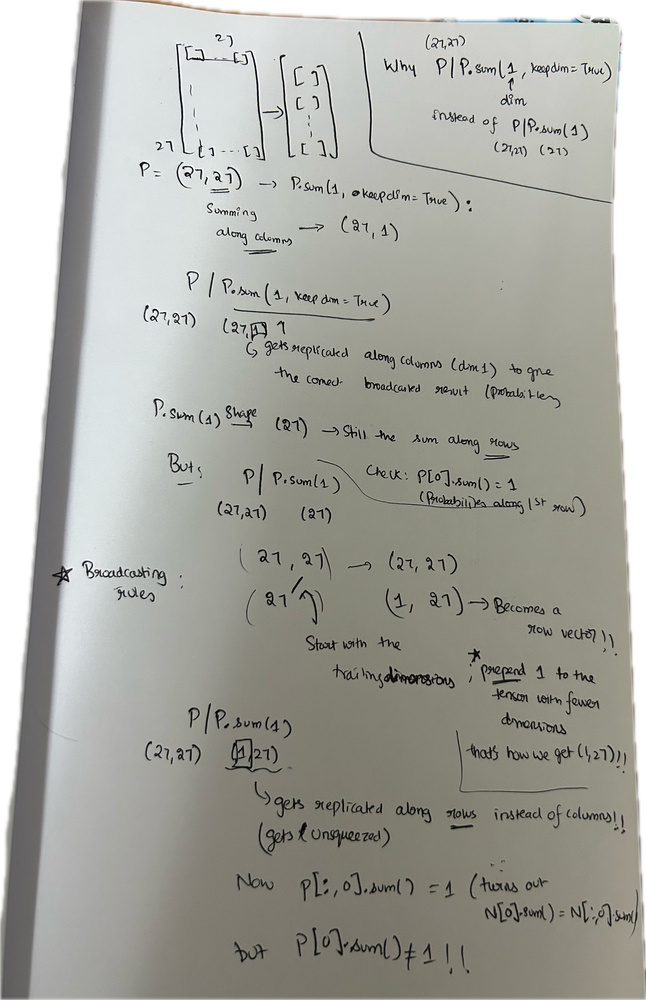

In [23]:
# sampling
g = torch.Generator().manual_seed(2147483647)

for i in range(5):

    out = []
    index = 0
    while True:
        #p = N[index].float() # going to the letter enumerated "index", and sampling from its bigrams
        #p = p / p.sum()
        #p = torch.ones(27) / 27.0 # every letter is equally likely
        p = P[index]
        index = torch.multinomial(p, num_samples = 1, replacement=True, generator=g).item() # sampling a letter from the prob dist of p
        out.append(itos[index])
        if index == 0: 
            break # we have reached a stopping sign (.)
    print(''.join(out))

cexze.
momasurailezitynn.
konimittain.
llayn.
ka.


In [24]:
# GOAL: maximize likelihood of the data w.r.t. model parameters (statistical modeling)
# equivalent to maximizing the log likelihood (because log is monotonic)
# equivalent to minimizing the negative log likelihood
# equivalent to minimizing the average negative log likelihood
# log(a*b*c) = log(a) + log(b) + log(c)

In [25]:
log_likelihood = 0.0
n = 0

for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        prob = P[ix1, ix2]
        logprob = torch.log(prob)
        log_likelihood += logprob
        n += 1
        #print(f'{ch1}{ch2}: {prob: .4f} {logprob: .4f}')

print(f'{log_likelihood=}')
nll = -log_likelihood
print(f'{nll=}')
print(f'{nll/n}') # measuring the nll loss of the dataset wrt itself

log_likelihood=tensor(-559951.5625)
nll=tensor(559951.5625)
2.4543561935424805


In [26]:
# create the training set of bigrams (x,y); x is the first character of the bigram (input), y is the second one (which we want to predict)
xs, ys = [], []

for w in words[:1]:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        print(ch1, ch2)
        xs.append(ix1)
        ys.append(ix2)

xs = torch.tensor(xs) # torch.tensor retains the datatype of xs unlike torch.Tensor which converts the input to Float
ys = torch.tensor(ys)

. e
e m
m m
m a
a .


In [27]:
xs

tensor([ 0,  5, 13, 13,  1])

In [28]:
ys

tensor([ 5, 13, 13,  1,  0])

In [29]:
import torch.nn.functional as F
xenc = F.one_hot(xs, num_classes=27).float()
xenc

tensor([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0.]])

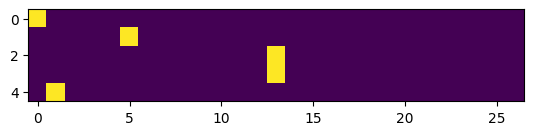

In [30]:
plt.imshow(xenc)

In [31]:
xenc.dtype

torch.float32

In [32]:
W = torch.randn((27,1)) # a single neuron has 27 weights
xenc @ W

tensor([[-0.3524],
        [-0.2647],
        [ 0.9218],
        [ 0.9218],
        [-0.3922]])

In [33]:
W = torch.randn((27,27)) # a layer of 27 neurons, each of which has 27 weights
xenc @ W # (5,27) @ (27,27) -> (5,27); 

tensor([[ 1.4175,  1.2517,  1.6174,  0.4060,  0.2059,  0.1220,  0.7249, -1.4201,
         -0.7728, -1.5479,  0.0180, -1.1455,  0.6215,  0.3174, -0.6555, -1.1082,
         -1.4252,  0.4795,  0.0076,  0.9888, -0.2462, -1.7394, -0.9033, -1.3263,
         -1.0953, -0.5775,  0.4052],
        [-1.0997, -1.8794, -0.3804,  0.1421, -0.8821, -0.6987,  0.3167,  0.4113,
         -0.7058, -0.5923, -0.4322, -0.7387,  1.0391, -0.9567, -0.6036, -1.2933,
         -0.9984, -0.6637, -0.1803,  0.3422, -2.4881,  0.0714, -0.4842, -1.6757,
          1.7697, -0.1834, -1.4074],
        [ 0.1094, -0.7678, -1.6041, -1.8983, -0.7151,  1.1922,  0.5015, -0.5705,
         -1.3984, -1.3147,  1.1511,  1.1993, -1.7255,  0.5680, -0.8883,  1.3105,
          0.4568,  0.2892,  0.9532,  1.8152,  0.5189, -0.6948,  0.0124,  1.6955,
          1.1058, -0.4069,  1.2340],
        [ 0.1094, -0.7678, -1.6041, -1.8983, -0.7151,  1.1922,  0.5015, -0.5705,
         -1.3984, -1.3147,  1.1511,  1.1993, -1.7255,  0.5680, -0.8883,  1.3105

In [34]:
(xenc @ W)[3, 13] # dot product of the third input example with the 13th neuron in the layer

tensor(0.5680)

In [35]:
(xenc[3] * W[:, 13]).sum()

tensor(0.5680)

In [36]:
logits = (xenc @ W) # interpreted as log(counts)
counts = logits.exp() # equivalent to N (the counts)
probs = counts / counts.sum(1, keepdims=True)
probs

tensor([[0.1196, 0.1013, 0.1461, 0.0435, 0.0356, 0.0327, 0.0598, 0.0070, 0.0134,
         0.0062, 0.0295, 0.0092, 0.0540, 0.0398, 0.0150, 0.0096, 0.0070, 0.0468,
         0.0292, 0.0779, 0.0227, 0.0051, 0.0117, 0.0077, 0.0097, 0.0163, 0.0435],
        [0.0137, 0.0063, 0.0281, 0.0473, 0.0170, 0.0204, 0.0564, 0.0620, 0.0203,
         0.0227, 0.0267, 0.0196, 0.1161, 0.0158, 0.0225, 0.0113, 0.0151, 0.0211,
         0.0343, 0.0578, 0.0034, 0.0441, 0.0253, 0.0077, 0.2410, 0.0342, 0.0101],
        [0.0230, 0.0096, 0.0042, 0.0031, 0.0101, 0.0681, 0.0341, 0.0117, 0.0051,
         0.0055, 0.0653, 0.0685, 0.0037, 0.0365, 0.0085, 0.0766, 0.0326, 0.0276,
         0.0536, 0.1269, 0.0347, 0.0103, 0.0209, 0.1126, 0.0624, 0.0138, 0.0710],
        [0.0230, 0.0096, 0.0042, 0.0031, 0.0101, 0.0681, 0.0341, 0.0117, 0.0051,
         0.0055, 0.0653, 0.0685, 0.0037, 0.0365, 0.0085, 0.0766, 0.0326, 0.0276,
         0.0536, 0.1269, 0.0347, 0.0103, 0.0209, 0.1126, 0.0624, 0.0138, 0.0710],
        [0.0170, 0.0090,

In [37]:
probs.shape # each row is interpreted to be the probabilities of the 27 possible outputs for that input x

torch.Size([5, 27])

In [38]:
probs[0] # interpreted to be the probabilities of each output following the input character '.' (xenc[0])

tensor([0.1196, 0.1013, 0.1461, 0.0435, 0.0356, 0.0327, 0.0598, 0.0070, 0.0134,
        0.0062, 0.0295, 0.0092, 0.0540, 0.0398, 0.0150, 0.0096, 0.0070, 0.0468,
        0.0292, 0.0779, 0.0227, 0.0051, 0.0117, 0.0077, 0.0097, 0.0163, 0.0435])

In [39]:
probs[0].sum()

tensor(1.)

In [40]:
### SUMMARY

In [41]:
xs, ys

(tensor([ 0,  5, 13, 13,  1]), tensor([ 5, 13, 13,  1,  0]))

In [42]:
# randomly initialize 27 neurons' weights, each neuron receives 27 inputs
g = torch.Generator().manual_seed(2147483647)
W = torch.randn(27,27, generator=g, requires_grad=True)

In [43]:
# forward pass
xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoded
logits = xenc @ W # predict the log-counts
counts = logits.exp() # counts; equivalent to N
probs = counts / counts.sum(1, keepdims=True) # probabilities for the next character
# the last two operations above are called 'softmax'
loss = -probs[torch.arange(5), ys].log().mean() # a more efficient way of indexing into the output probabilities at the actual character indexes

In [44]:
nlls = torch.zeros(5)

for i in range(5): # ith bigram
    x = xs[i].item() # input character index
    y = ys[i].item() # output character index
    print('-------')
    print(f'bigram example {i+1}: {itos[x]}{itos[y]} (indexes {x}, {y})')
    print('input to the neural net:', x)
    print('output probabilities from the neural net:', probs[i])
    print('label (actual next character):', y)
    p = probs[i,y]
    print('probability assigned by the neural net to the correct character:', p.item())
    logprob = torch.log(p)
    print('log likelihood:', logprob.item())
    nll = -logprob
    print('negative log likelihood:', nll.item())
    nlls[i] = nll

print('========')
print('average negative log likelihood:', nlls.mean().item())
    

-------
bigram example 1: .e (indexes 0, 5)
input to the neural net: 0
output probabilities from the neural net: tensor([0.0607, 0.0100, 0.0123, 0.0042, 0.0168, 0.0123, 0.0027, 0.0232, 0.0137,
        0.0313, 0.0079, 0.0278, 0.0091, 0.0082, 0.0500, 0.2378, 0.0603, 0.0025,
        0.0249, 0.0055, 0.0339, 0.0109, 0.0029, 0.0198, 0.0118, 0.1537, 0.1459],
       grad_fn=<SelectBackward0>)
label (actual next character): 5
probability assigned by the neural net to the correct character: 0.012286253273487091
log likelihood: -4.3992743492126465
negative log likelihood: 4.3992743492126465
-------
bigram example 2: em (indexes 5, 13)
input to the neural net: 5
output probabilities from the neural net: tensor([0.0290, 0.0796, 0.0248, 0.0521, 0.1989, 0.0289, 0.0094, 0.0335, 0.0097,
        0.0301, 0.0702, 0.0228, 0.0115, 0.0181, 0.0108, 0.0315, 0.0291, 0.0045,
        0.0916, 0.0215, 0.0486, 0.0300, 0.0501, 0.0027, 0.0118, 0.0022, 0.0472],
       grad_fn=<SelectBackward0>)
label (actual next chara

In [45]:
probs.shape

torch.Size([5, 27])

In [46]:
print(loss.item())

3.7693049907684326


In [47]:
# backward pass
W.grad = None # set the gradient to zero
loss.backward()

In [48]:
W.shape, W.grad.shape

(torch.Size([27, 27]), torch.Size([27, 27]))

In [49]:
# update
W.data += -0.1 * W.grad

In [50]:
# OPTIMIZATION

In [51]:
# create the dataset of bigrams
xs, ys = [], []

for w in words:
    chs = ['.'] + list(w) + ['.']
    for ch1, ch2 in zip(chs, chs[1:]):
        ix1 = stoi[ch1]
        ix2 = stoi[ch2]
        #print(ch1, ch2)
        xs.append(ix1)
        ys.append(ix2)

xs = torch.tensor(xs) # torch.tensor retains the datatype of xs unlike torch.Tensor which converts the input to Float
ys = torch.tensor(ys)
num = xs.nelement()
print('number of examples:', num)

# initialize the network
g = torch.Generator().manual_seed(2147483647)
W = torch.randn(27,27, generator=g, requires_grad=True)
# note that if W is all zeros, our distriution is completely smooth, i.e, all the probabilities are equal

number of examples: 228146


In [68]:
# gradient descent

for k in range(100):
    # forward pass
    #xenc = F.one_hot(xs, num_classes=27).float() # input to the network: one-hot encoded
    #logits = xenc @ W # predict the log-counts
    logits = W[xs]
    counts = logits.exp() # counts; equivalent to N; we want it to become closer and closer to the actual counts array N
    probs = counts / counts.sum(1, keepdims=True) # probabilities for the next character
    # the last two operations above are called 'softmax'
    #loss = -probs[torch.arange(num), ys].log().mean() + 0.01*(W**2).mean() # added regularization; increasing lambda corresponds to increasing X in P = (N+X).float()
    loss = F.cross_entropy(logits, ys) + 0.01*(W**2).mean()
    print(loss.item())

    # backward pass
    W.grad = None # set the gradient to zero
    loss.backward()

    # update
    W.data += -40* W.grad

2.4811415672302246
2.4811222553253174
2.481104612350464
2.481088161468506
2.4810729026794434
2.481058359146118
2.481044292449951
2.4810311794281006
2.4810187816619873
2.4810070991516113
2.4809951782226562
2.4809839725494385
2.480973720550537
2.4809632301330566
2.4809532165527344
2.480943441390991
2.4809343814849854
2.4809253215789795
2.480916738510132
2.480907917022705
2.4808998107910156
2.4808919429779053
2.480884552001953
2.4808766841888428
2.4808695316314697
2.4808623790740967
2.4808554649353027
2.480848789215088
2.480842113494873
2.4808359146118164
2.4808294773101807
2.480823278427124
2.4808173179626465
2.480811357498169
2.4808056354522705
2.480799913406372
2.4807944297790527
2.4807896614074707
2.4807841777801514
2.480778932571411
2.48077392578125
2.480769157409668
2.480764389038086
2.480759620666504
2.480755090713501
2.480750560760498
2.480746030807495
2.4807422161102295
2.4807376861572266
2.4807331562042236
2.480729341506958
2.4807252883911133
2.4807214736938477
2.480717182159424

In [69]:
# we get the same loss as measured on the training set wrt itself

In [67]:
# finally, sample from the neural net
g = torch.Generator().manual_seed(2147483647)

for i in range(5):

    out = []
    index = 0
    while True:
        # BEFORE
        #p = P[index]
        #NOW
        xenc = F.one_hot(torch.tensor([index]), num_classes=27).float() 
        logits = xenc @ W # predict the log-counts
        counts = logits.exp() # counts; equivalent to N; we want it to become closer and closer to the actual counts array N
        p = counts / counts.sum(1, keepdims=True) # probabilities for the next character
        
        index = torch.multinomial(p, num_samples = 1, replacement=True, generator=g).item() # sampling a letter from the prob dist of p
        out.append(itos[index])
        if index == 0: 
            break # we have reached a stopping sign (.)
    print(''.join(out))

cexze.
momasurailezitynn.
konimittain.
llayn.
ka.


In [136]:
xenc.shape

torch.Size([27])